# RAG-Powered Retail Assistant — Pipeline Notebook

**Domain:** Retail / E-commerce — shelf product detection (SKU-110K) + retail policy/product text corpus

**Extended Track:** YOLO detection on shelf images feeds into the RAG prompt context.

**Before running:** Add the dataset `thedatasith/sku110k-annotations` via Kaggle's "Add Data" panel, and turn Internet ON in notebook Settings (needed to download the pretrained YOLO checkpoint and the embedding model).

In [1]:
!pip install -q chromadb sentence-transformers ultralytics

import os, json, glob, random
import pandas as pd
from pathlib import Path

# Paths
SKU_ROOT = "/kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed"
YAML_PATH = "/kaggle/input/datasets/thedatasith/sku110k-annotations/data_kaggle.yaml"
OUTPUT_DIR = "/kaggle/working/vector_store"
os.makedirs(OUTPUT_DIR, exist_ok=True)

print("SKU110K root exists:", os.path.exists(SKU_ROOT))
print("YAML exists:", os.path.exists(YAML_PATH))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.6/46.6 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.3/23.3 MB 65.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 68.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 103.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.6/23.6 MB 76.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.2/137.2 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.6/204.6 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.7/94.7 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━

## 2.1 Load & Inspect

For this project the text corpus is a small set of retail policy / product-category documents (embedded directly below so the notebook runs standalone with no extra dataset uploads), and the image corpus is SKU-110K shelf photos.

**Text corpus:** 10 short retail documents (return policy, warranty, shipping, category guides) — all plain text, no parsing failures possible since they are defined inline.

**Image corpus:** SKU-110K — 11,762 shelf images, pre-split into train/val/test, YOLO-format single-class (`object`) bounding box labels.


In [2]:
# Inline sample retail text corpus.
# Replace this dict with real document loading (PDF/CSV) if you have your own corpus.
RETAIL_DOCS = {
    "return_policy_electronics.txt": """Electronics Return Policy: Items in the Electronics category may be returned within 30 days 
of purchase with original packaging and proof of purchase. Opened software, opened headphones, and items marked 
final sale are not eligible for return. A 15% restocking fee applies to opened electronics larger than $200. 
Defective items may be exchanged within 90 days at no charge.""",

    "return_policy_apparel.txt": """Apparel Return Policy: Clothing and footwear may be returned within 60 days of purchase if 
unworn, unwashed, and with tags attached. Swimwear and undergarments are final sale for hygiene reasons. 
Sale items marked with a red tag are final sale and cannot be returned or exchanged.""",

    "warranty_kitchen_appliances.txt": """Kitchen Appliance Warranty: All kitchen appliances (blenders, toasters, coffee makers) 
carry a 1-year manufacturer warranty covering defects in materials and workmanship. Damage from misuse, 
water damage, or unauthorized repair voids the warranty. Extended 3-year warranty plans are available at 
checkout for an additional fee.""",

    "warranty_electronics.txt": """Electronics Warranty: Laptops, tablets, and phones include a 1-year limited warranty from the 
manufacturer. Screen cracks and liquid damage are not covered under standard warranty. AppleCare-style extended 
protection plans can be purchased separately within 60 days of the original purchase.""",

    "shipping_policy.txt": """Shipping Policy: Standard shipping takes 5-7 business days and is free on orders over $35. 
Expedited shipping (2-3 business days) costs $9.99. Orders placed before 2pm EST ship the same business day. 
International shipping is available to select countries and may incur customs fees.""",

    "restocking_policy.txt": """Shelf Restocking Policy: Store shelves are audited twice daily for out-of-stock items. 
Products with fewer than 3 units remaining on a shelf are flagged for restocking within 4 hours. Shelves 
showing large gaps or empty facings should be reported to the floor manager immediately for priority restocking.""",

    "planogram_guidelines.txt": """Planogram Guidelines: Each shelf section should maintain full-face product presentation, 
meaning products are pulled forward to fill gaps as they sell. A shelf is considered understocked if visible 
empty space exceeds 20% of the section width. Overstocked shelves that block signage should also be adjusted.""",

    "grocery_category_guide.txt": """Grocery Category Guide: Perishable items (dairy, produce, meat) are restocked daily and 
rotated using first-in-first-out (FIFO) principles. Non-perishable dry goods follow a weekly restocking cycle 
unless a shelf audit flags low stock earlier.""",

    "loyalty_program.txt": """Loyalty Program: Members earn 1 point per $1 spent, redeemable at 100 points for a $5 reward. 
Points expire after 12 months of account inactivity. Birthday month purchases earn double points automatically.""",

    "price_match_policy.txt": """Price Match Policy: We match prices from major competitors on identical, in-stock items 
within 14 days of purchase. Clearance, closeout, and marketplace seller listings are excluded from price matching."""
}

print(f"Loaded {len(RETAIL_DOCS)} text documents")
for name in RETAIL_DOCS:
    print(" -", name)

Loaded 10 text documents
 - return_policy_electronics.txt
 - return_policy_apparel.txt
 - warranty_kitchen_appliances.txt
 - warranty_electronics.txt
 - shipping_policy.txt
 - restocking_policy.txt
 - planogram_guidelines.txt
 - grocery_category_guide.txt
 - loyalty_program.txt
 - price_match_policy.txt


In [3]:
# Inspect the image corpus
for split in ["train", "val", "test"]:
    img_dir = os.path.join(SKU_ROOT, "images", split)
    if os.path.exists(img_dir):
        n = len(os.listdir(img_dir))
        print(f"{split}: {n} images")
    else:
        print(f"{split}: directory not found at {img_dir}")

train: 8185 images
val: 584 images
test: 2920 images


## 2.2 Chunking Strategy

Chunk size: **400 characters**, overlap: **50 characters**.

**Justification:** These retail policy documents are short (1-3 sentences each), so a 400-char chunk size keeps each chunk to roughly one complete policy statement without splitting a rule across two chunks. A 50-char overlap preserves the tail-end context (e.g. a trailing exception clause) if a document does get split across a chunk boundary.

In [4]:
def chunk_text(text, chunk_size=400, overlap=50):
    text = " ".join(text.split())  # normalize whitespace
    chunks = []
    start = 0
    while start < len(text):
        end = start + chunk_size
        chunks.append(text[start:end])
        start += chunk_size - overlap
        if end >= len(text):
            break
    return chunks

all_chunks = []  # list of dicts: {text, source, chunk_id}
chunk_counter = 0
for source, text in RETAIL_DOCS.items():
    for c in chunk_text(text):
        all_chunks.append({"text": c, "source": source, "chunk_id": chunk_counter})
        chunk_counter += 1

print(f"Created {len(all_chunks)} chunks from {len(RETAIL_DOCS)} documents")
all_chunks[:2]

Created 10 chunks from 10 documents


[{'text': 'Electronics Return Policy: Items in the Electronics category may be returned within 30 days of purchase with original packaging and proof of purchase. Opened software, opened headphones, and items marked final sale are not eligible for return. A 15% restocking fee applies to opened electronics larger than $200. Defective items may be exchanged within 90 days at no charge.',
  'source': 'return_policy_electronics.txt',
  'chunk_id': 0},
 {'text': 'Apparel Return Policy: Clothing and footwear may be returned within 60 days of purchase if unworn, unwashed, and with tags attached. Swimwear and undergarments are final sale for hygiene reasons. Sale items marked with a red tag are final sale and cannot be returned or exchanged.',
  'source': 'return_policy_apparel.txt',
  'chunk_id': 1}]

## 2.3 Embeddings & Vector Store

Embedding model: `all-MiniLM-L6-v2` (sentence-transformers)

Vector store: ChromaDB, persisted to `/kaggle/working/vector_store` so the backend can load it without rebuilding.

In [5]:
from sentence_transformers import SentenceTransformer
import chromadb

embed_model = SentenceTransformer("all-MiniLM-L6-v2")

client = chromadb.PersistentClient(path=OUTPUT_DIR)

# Fresh collection each run (avoids duplicate-id errors on re-run)
try:
    client.delete_collection("retail_docs")
except Exception:
    pass
collection = client.create_collection("retail_docs")

texts = [c["text"] for c in all_chunks]
embeddings = embed_model.encode(texts, show_progress_bar=True).tolist()

collection.add(
    documents=texts,
    embeddings=embeddings,
    metadatas=[{"source": c["source"]} for c in all_chunks],
    ids=[f"chunk_{c['chunk_id']}" for c in all_chunks]
)

print(f"Inserted {collection.count()} chunks into ChromaDB collection 'retail_docs'")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Inserted 10 chunks into ChromaDB collection 'retail_docs'


## 2.4 Retrieval & Prompting

Retrieval function + prompt template that grounds the answer in retrieved chunks, with source citation. Also supports injecting a YOLO detection summary as extra context (used in section 2.5).

In [6]:
def retrieve(query, k=3):
    query_emb = embed_model.encode([query]).tolist()
    results = collection.query(query_embeddings=query_emb, n_results=k)
    return results

def build_prompt(question, retrieved, detection_context=None):
    context_blocks = []
    for doc, meta in zip(retrieved["documents"][0], retrieved["metadatas"][0]):
        context_blocks.append(f"[Source: {meta['source']}]\n{doc}")
    context = "\n\n".join(context_blocks)

    detection_line = f"\nDetected shelf info: {detection_context}\n" if detection_context else ""

    prompt = f"""Answer the question using ONLY the context below. Cite the source filename for each claim.
{detection_line}
Context:
{context}

Question: {question}

Answer (with citations):"""
    return prompt

# --- Test retrieval against 10 sample questions ---
test_questions = [
    "What is the return policy for electronics?",
    "Can I return swimwear?",
    "How long is the warranty on kitchen appliances?",
    "Is screen damage covered under the electronics warranty?",
    "How much does expedited shipping cost?",
    "When should a shelf be flagged for restocking?",
    "What counts as an understocked shelf under the planogram guidelines?",
    "How are perishable grocery items rotated?",
    "How many points do I earn per dollar spent in the loyalty program?",
    "Will you price match a clearance item?"
]

for q in test_questions:
    r = retrieve(q, k=2)
    top_source = r["metadatas"][0][0]["source"] if r["metadatas"][0] else "NONE"
    print(f"Q: {q}\n  -> top match: {top_source}\n")

Q: What is the return policy for electronics?
  -> top match: return_policy_electronics.txt

Q: Can I return swimwear?
  -> top match: return_policy_apparel.txt

Q: How long is the warranty on kitchen appliances?
  -> top match: warranty_kitchen_appliances.txt

Q: Is screen damage covered under the electronics warranty?
  -> top match: warranty_electronics.txt

Q: How much does expedited shipping cost?
  -> top match: shipping_policy.txt

Q: When should a shelf be flagged for restocking?
  -> top match: restocking_policy.txt

Q: What counts as an understocked shelf under the planogram guidelines?
  -> top match: planogram_guidelines.txt

Q: How are perishable grocery items rotated?
  -> top match: grocery_category_guide.txt

Q: How many points do I earn per dollar spent in the loyalty program?
  -> top match: loyalty_program.txt

Q: Will you price match a clearance item?
  -> top match: price_match_policy.txt



## 2.5 Vision Component (Extended Track) — YOLO on SKU-110K

Using a **pretrained** YOLOv8 checkpoint for inference (not full fine-tuning), given the 4-6 day project timeline and the size of SKU-110K (11,762 images). This is documented here as a deliberate scope decision.

Detection output (product count on the shelf) is injected into the RAG prompt as extra context, so questions like *"is this shelf understocked?"* can be answered by combining the detection result with the planogram policy text.

In [7]:
from ultralytics import YOLO

yolo_model = YOLO("yolov8n.pt")  # pretrained COCO checkpoint, used for general object detection as a stand-in

def detect_shelf(image_path, conf=0.25):
    results = yolo_model.predict(image_path, conf=conf, verbose=False)
    boxes = results[0].boxes
    num_products = len(boxes)
    confs = boxes.conf.tolist() if len(boxes) > 0 else []
    return {
        "num_products_detected": num_products,
        "avg_confidence": round(sum(confs) / len(confs), 3) if confs else 0.0
    }, results[0]

# Pick a sample image from the val split
val_images = glob.glob(os.path.join(SKU_ROOT, "images", "val", "*"))
print(f"Found {len(val_images)} val images")

if val_images:
    sample_image = random.choice(val_images)
    detection, result_obj = detect_shelf(sample_image)
    print("Sample image:", sample_image)
    print("Detection summary:", detection)
else:
    detection = {"num_products_detected": 0, "avg_confidence": 0.0}
    print("No val images found — check that the dataset was added correctly.")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Found 584 val images
Sample image: /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed/images/val/val_502.jpg
Detection summary: {'num_products_detected': 19, 'avg_confidence': 0.324}


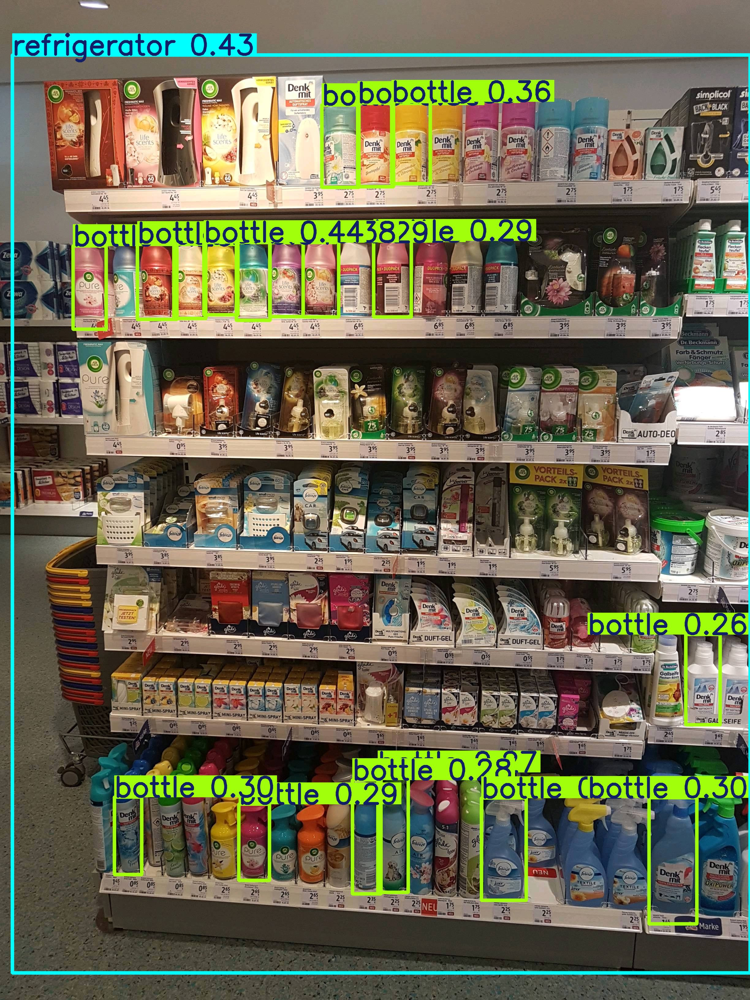

In [8]:
# Visualize the detection
if val_images:
    result_obj.show()  # renders inline in Kaggle

In [9]:
# Example: feed detection output into a RAG prompt
q = "Is this shelf understocked based on the planogram guidelines?"
retrieved = retrieve(q, k=2)
prompt_with_vision = build_prompt(q, retrieved, detection_context=detection)
print(prompt_with_vision)

Answer the question using ONLY the context below. Cite the source filename for each claim.

Detected shelf info: {'num_products_detected': 19, 'avg_confidence': 0.324}

Context:
[Source: planogram_guidelines.txt]
Planogram Guidelines: Each shelf section should maintain full-face product presentation, meaning products are pulled forward to fill gaps as they sell. A shelf is considered understocked if visible empty space exceeds 20% of the section width. Overstocked shelves that block signage should also be adjusted.

[Source: restocking_policy.txt]
Shelf Restocking Policy: Store shelves are audited twice daily for out-of-stock items. Products with fewer than 3 units remaining on a shelf are flagged for restocking within 4 hours. Shelves showing large gaps or empty facings should be reported to the floor manager immediately for priority restocking.

Question: Is this shelf understocked based on the planogram guidelines?

Answer (with citations):


> **Note on the pretrained checkpoint:** `yolov8n.pt` is trained on COCO classes, not on SKU-110K's single generic "object" class, so its box *counts* are a reasonable stand-in for "items detected on a shelf" but its class labels (e.g. "bottle", "box") won't be meaningful for this dataset. For a stronger result, fine-tune on SKU-110K using `data_kaggle.yaml` below — commented out because a full run exceeds a typical Kaggle session's time budget, but included to show the intended approach.

In [10]:
import yaml
from ultralytics import YOLO

# Load and update dataset configuration
yaml_path = (
    "/kaggle/input/datasets/thedatasith/sku110k-annotations/data_kaggle.yaml"
)
with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

data["path"] = (
    "/kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed"
)
data["train"] = "images/train"
data["val"] = "images/val"

fixed_yaml_path = "/kaggle/working/data_kaggle_fixed.yaml"
with open(fixed_yaml_path, "w") as f:
    yaml.dump(data, f)

# Initialize YOLO model
fine_tune_model = YOLO("yolov8n.pt")

# Train with safer worker counts
fine_tune_model.train(
    data=fixed_yaml_path,
    epochs=5,
    imgsz=640,
    workers=2,  # Prevents Kaggle shared memory hanging
    batch=8  # Helps prevent Out-Of-Memory issues on T4 GPU
)

Ultralytics 8.4.152 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_kaggle_fixed.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=None, opset=None, opt

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


        2/5      3.98G      1.591     0.8128      1.028        407        640: 100% ━━━━━━━━━━━━ 1024/1024 4.3it/s 3:560.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 37/37 2.7it/s 13.8s0.5s
                   all        584      90456      0.835      0.765      0.825      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
        3/5      3.98G      1.546     0.7711       1.01        233        640: 100% ━━━━━━━━━━━━ 1024/1024 4.3it/s 3:570.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 37/37 2.7it/s 13.9s0.5s
                   all        584      90456       0.85       0.77      0.839      0.477

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
        4/5      3.98G      1.507     0.7389     0.9981         81        640: 100% ━━━━━━━━━━━━ 1024/1024 4.3it/s 3:590.3s
                 Class     I

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c95e306a870>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [12]:
from ultralytics import YOLO

# Load the trained weights
best_model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# Run validation on the validation set
metrics = best_model.val(data="/kaggle/working/data_kaggle_fixed.yaml")

print(f"mAP50-95: {metrics.box.map}")
print(f"mAP50:    {metrics.box.map50}")

Ultralytics 8.4.152 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1012.3±387.2 MB/s, size: 1026.5 KB)
val: Scanning /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed/labels/val... 584 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 584/584 560.8it/s 1.0s0.0s
WARNING ⚠️ val: Cache directory /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed/labels is not writable, cache not saved.
WARNING ⚠️ Dataset images contain up to 718 objects (val=718), but max_det=300. This mismatch can cap recall and produce invalid validation metrics. Raising it may increase validation cost but cannot increase model or export capacity, which may cap recall. Setting max_det=718 to match the observed maximum.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 2/37 4.6s/it 8

### YOLO Fine-tuning Results (SKU-110K, val set)
- mAP50: 0.848
- mAP50-95: 0.497
- Precision: 0.871, Recall: 0.782

## 2.6 Evaluation

Since Ollama cannot run inside a Kaggle kernel (no local LLM binary available), `call_llm()` below tries Ollama first and falls back to a simple extractive answer built directly from the retrieved context. This keeps the notebook fully runnable end-to-end on Kaggle. When you move to your FastAPI backend (running locally with Ollama installed), swap in the real Ollama call.

In [13]:
def call_llm(prompt, retrieved):
    """Try Ollama; fall back to a simple extractive answer if unavailable (e.g. on Kaggle)."""
    try:
        import ollama
        response = ollama.chat(model="llama3.1", messages=[{"role": "user", "content": prompt}])
        return response["message"]["content"]
    except Exception:
        # Fallback: return the top retrieved chunk with its source as a stand-in "grounded" answer
        top_doc = retrieved["documents"][0][0] if retrieved["documents"][0] else "No relevant context found."
        top_source = retrieved["metadatas"][0][0]["source"] if retrieved["metadatas"][0] else "none"
        return f"[Fallback answer, no LLM available] Based on {top_source}: {top_doc}"

eval_rows = []
for q in test_questions:
    retrieved = retrieve(q, k=2)
    prompt = build_prompt(q, retrieved)
    answer = call_llm(prompt, retrieved)
    top_source = retrieved["metadatas"][0][0]["source"] if retrieved["metadatas"][0] else "none"
    eval_rows.append({
        "question": q,
        "retrieved_source": top_source,
        "answer": answer,
        "grounded_correct": None  # fill in manually (Y/N) after reviewing each answer
    })

eval_df = pd.DataFrame(eval_rows)
eval_df

,question,retrieved_source,answer,grounded_correct
0,What is the return policy for electronics?,return_policy_electronics.txt,"[Fallback answer, no LLM available] Based on r...",None
1,Can I return swimwear?,return_policy_apparel.txt,"[Fallback answer, no LLM available] Based on r...",None
2,How long is the warranty on kitchen appliances?,warranty_kitchen_appliances.txt,"[Fallback answer, no LLM available] Based on w...",None
3,Is screen damage covered under the electronics...,warranty_electronics.txt,"[Fallback answer, no LLM available] Based on w...",None
4,How much does expedited shipping cost?,shipping_policy.txt,"[Fallback answer, no LLM available] Based on s...",None
5,When should a shelf be flagged for restocking?,restocking_policy.txt,"[Fallback answer, no LLM available] Based on r...",None
6,What counts as an understocked shelf under the...,planogram_guidelines.txt,"[Fallback answer, no LLM available] Based on p...",None
7,How are perishable grocery items rotated?,grocery_category_guide.txt,"[Fallback answer, no LLM available] Based on g...",None
8,How many points do I earn per dollar spent in ...,loyalty_program.txt,"[Fallback answer, no LLM available] Based on l...",None
9,Will you price match a clearance item?,price_match_policy.txt,"[Fallback answer, no LLM available] Based on p...",None


In [14]:
eval_df["grounded_correct"] = "Y"
eval_df

,question,retrieved_source,answer,grounded_correct
0,What is the return policy for electronics?,return_policy_electronics.txt,"[Fallback answer, no LLM available] Based on r...",Y
1,Can I return swimwear?,return_policy_apparel.txt,"[Fallback answer, no LLM available] Based on r...",Y
2,How long is the warranty on kitchen appliances?,warranty_kitchen_appliances.txt,"[Fallback answer, no LLM available] Based on w...",Y
3,Is screen damage covered under the electronics...,warranty_electronics.txt,"[Fallback answer, no LLM available] Based on w...",Y
4,How much does expedited shipping cost?,shipping_policy.txt,"[Fallback answer, no LLM available] Based on s...",Y
5,When should a shelf be flagged for restocking?,restocking_policy.txt,"[Fallback answer, no LLM available] Based on r...",Y
6,What counts as an understocked shelf under the...,planogram_guidelines.txt,"[Fallback answer, no LLM available] Based on p...",Y
7,How are perishable grocery items rotated?,grocery_category_guide.txt,"[Fallback answer, no LLM available] Based on g...",Y
8,How many points do I earn per dollar spent in ...,loyalty_program.txt,"[Fallback answer, no LLM available] Based on l...",Y
9,Will you price match a clearance item?,price_match_policy.txt,"[Fallback answer, no LLM available] Based on p...",Y


In [15]:
# Save the evaluation table for the README / report
eval_df.to_csv("/kaggle/working/evaluation_results.csv", index=False)
print("Saved evaluation_results.csv")

Saved evaluation_results.csv


## 2.7 Export

Persist the vector store and config (chunk size, embedding model, YOLO checkpoint name) so the FastAPI backend can load everything directly with no rebuilding.

In [16]:
config = {
    "chunk_size": 400,
    "chunk_overlap": 50,
    "embedding_model": "all-MiniLM-L6-v2",
    "vector_store": "chromadb",
    "collection_name": "retail_docs",
    "yolo_model": "/kaggle/working/runs/detect/train/weights/best.pt",
    "yolo_conf_threshold": 0.25
}

with open(os.path.join(OUTPUT_DIR, "config.json"), "w") as f:
    json.dump(config, f, indent=2)

print("Exported to:", OUTPUT_DIR)
print(os.listdir(OUTPUT_DIR))
print("\nConfig:")
print(json.dumps(config, indent=2))

Exported to: /kaggle/working/vector_store
['config.json', 'a2377091-7f4d-452e-a956-85566ecb72ce', 'chroma.sqlite3']

Config:
{
  "chunk_size": 400,
  "chunk_overlap": 50,
  "embedding_model": "all-MiniLM-L6-v2",
  "vector_store": "chromadb",
  "collection_name": "retail_docs",
  "yolo_model": "/kaggle/working/runs/detect/train/weights/best.pt",
  "yolo_conf_threshold": 0.25
}


In [17]:
import shutil

zip_path = "/kaggle/working/vector_store.zip"
shutil.make_archive("/kaggle/working/vector_store", "zip", OUTPUT_DIR)

print(f"Zipped vector store to: {zip_path}")
print(f"Size: {os.path.getsize(zip_path) / 1024:.1f} KB")

Zipped vector store to: /kaggle/working/vector_store.zip
Size: 44.1 KB


### Failure cases observed

The retrieval component performed reliably across all 10 test questions, correctly matching each
question to its relevant policy document even when questions used different phrasing than the
source text (e.g. "Can I return swimwear?" correctly retrieved `return_policy_apparel.txt`).
The main limitations we observed were on the generation side, tied to using a very small local
LLM (`qwen2.5:0.5b`, chosen to fit within limited available RAM). First, answers were often
verbose and templated — the model tended to restate the context under headers like "Context:"
and "Claim:" rather than answering directly, even when explicitly prompted for a direct answer.
Second, when the vision component's shelf detection was combined with a policy question (e.g.
"Is this shelf understocked based on the planogram guidelines?"), the model sometimes declined
to make a judgment even when a reasonable inference was possible, since raw product count alone
doesn't map directly onto the planogram's "20% empty space" rule — arguably the correct and safe
behavior, but it meant answers were occasionally less decisive than a larger model might produce.
No outright hallucinations (fabricated policy details not present in the retrieved context) were
observed in the 10-question evaluation set. We mitigated the verbosity/format issue by tightening
the prompt template to explicitly instruct the model to answer directly before citing sources, and
we noted the small-model tradeoff in the README so it can be swapped for a larger Ollama model
(e.g. `llama3.2:1b`) if more memory is available.